<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"></ul></div>

In [1]:
import numpy as np, matplotlib.pyplot as plt, pandas as pd, matplotlib as mpl
import seaborn as sns
import pcmdpy as ppy
from corner import corner
%matplotlib inline

GPU acceleration not available, sorry
No module named 'pycuda'


In [2]:
# sns.set_context('notebook')

In [3]:
results = {}
truths = {}
# priors = {}

In [4]:
t0_tau = ppy.agemodels.TauModel(np.array([2., 1.]), iso_step=-1)
truths[0] = ppy.galaxy.DefaultNonParam.get_model(np.append(np.array([-0.2, -0.5]),np.log10(t0_tau.SFH)))

In [5]:
t1_tau = ppy.agemodels.TauModel(np.array([2., 2.]), iso_step=-1)
truths[1] = ppy.galaxy.DefaultNonParam.get_model(np.append(np.array([-0.2, -0.5]), np.log10(t1_tau.SFH)))

In [6]:
t2_tau = ppy.agemodels.ConstantSFR(np.array([2.]), iso_step=-1)
truths[2] = ppy.galaxy.DefaultNonParam.get_model(np.append(np.array([-0.2, -0.5]), np.log10(t2_tau.SFH)))

In [7]:
t3_tau = ppy.agemodels.TauModel(np.array([2., -1.]), iso_step=-1)
truths[3] = ppy.galaxy.DefaultNonParam.get_model(np.append(np.array([-0.2, -0.5]), np.log10(t3_tau.SFH)))

In [8]:
for i in range(4, 16):
    truths[i] = truths[i % 4]

In [9]:
truths[16] = truths[2]

In [10]:
t17_tau = ppy.agemodels.ConstantSFR(np.array([4.]), iso_step=-1)
truths[17] = ppy.galaxy.DefaultNonParam.get_model(np.append(np.array([-0.2, -0.5]), np.log10(t17_tau.SFH)))

In [11]:
names = {}
names[0] = r'$\tau = 1 Gyr$'
names[1] = r'$\tau = 2 Gyr$'
names[2] = r'Constant SFR'
names[3] = r'Rising SFH'
names[4] = names[5] = names[6] = names[7] = 'Gaussian MDF'
names[8] = names[9] = names[10] = names[11] = 'Lognormal Dust'
names[12] = names[13] = names[14] = names[15] = 'Lognormal Npix'
names[16] = 'Nim = 256'
names[17] = 'Npix = 1e4'

In [12]:
for i in range(18):
    try:
        results[i] = ppy.utils.ResultsPlotter('results/mockgrid_{:d}.csv'.format(i), true_model=truths[i],
                                            prior=None, run_name=names[i])
    except:
        pass
    else:
        print(i)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17


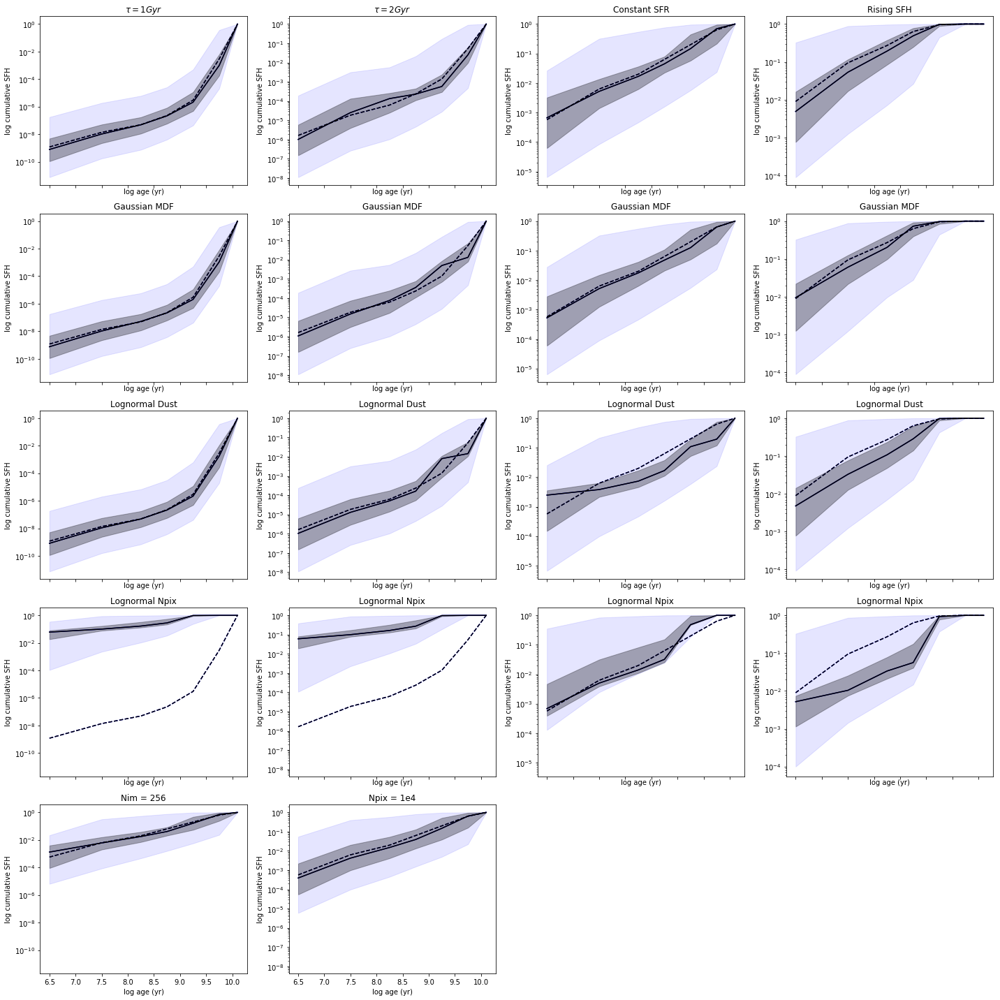

In [13]:
fig, axes = plt.subplots(ncols=4, nrows=5, figsize=(20, 20), sharex=True, sharey='col')
axes = axes.flatten()
for i in results.keys():
    _ = results[i].plot_cum_sfh(axis=axes[i], show_prior=True)
for ax in axes[-2:]:
    ax.axis('off')
plt.tight_layout()

In [14]:
ch_kw = None
csfh_kw = {'show_prior':True}
corn_kw = {'weight':False}

In [15]:
burns = {i:0 for i in range(18)}

/Users/bcook/.local/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


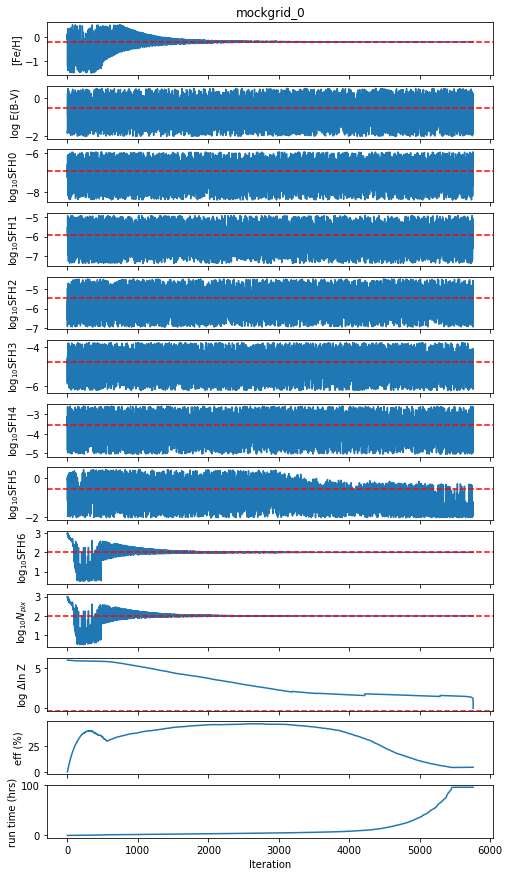

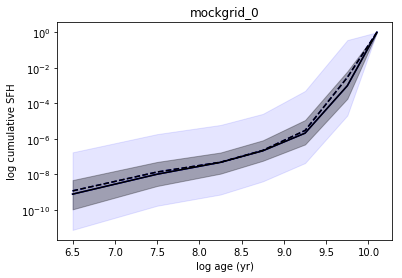

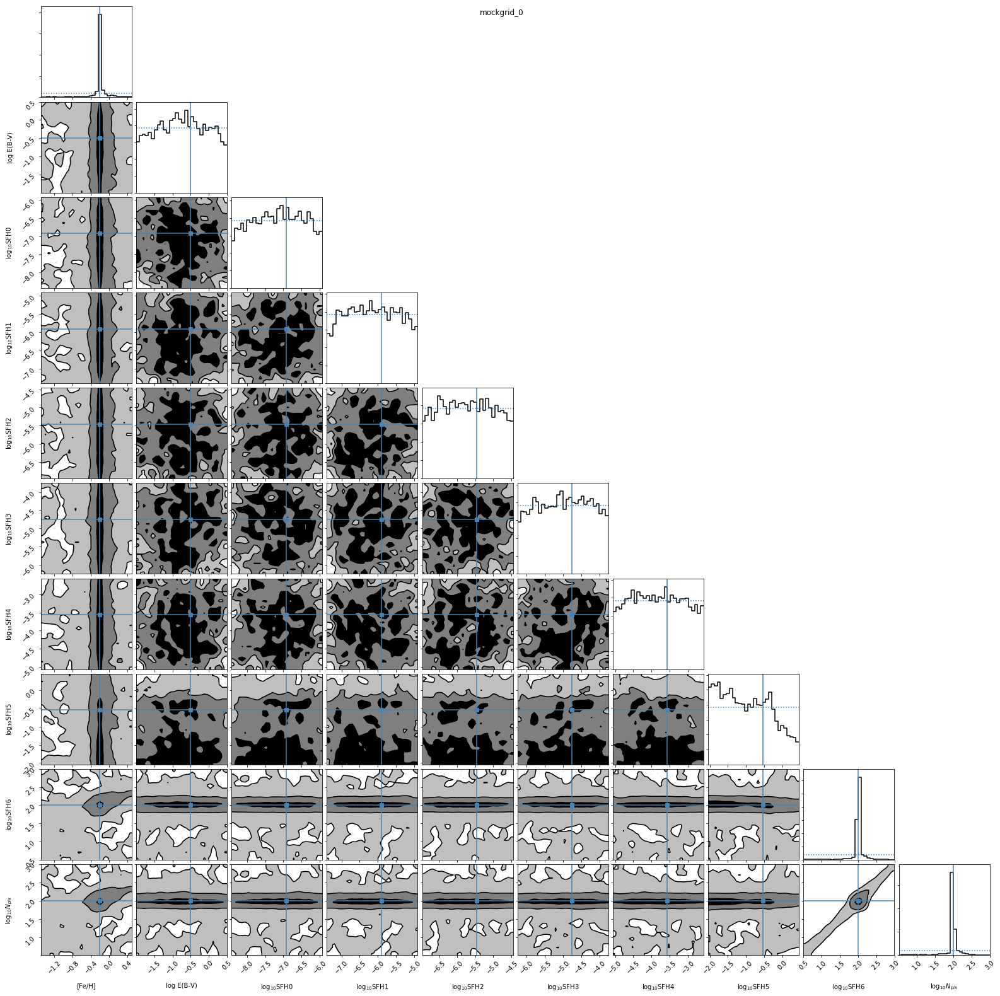

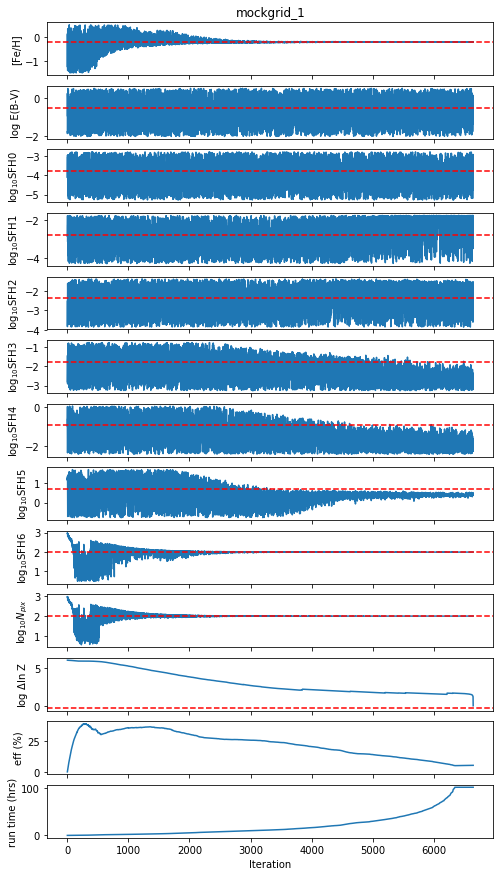

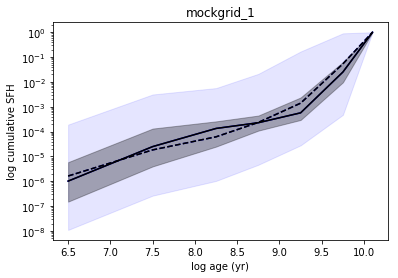

...

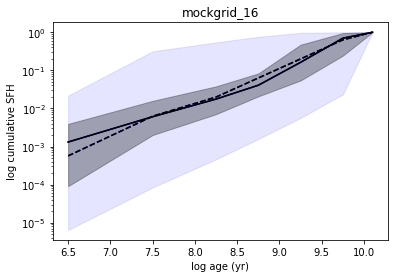

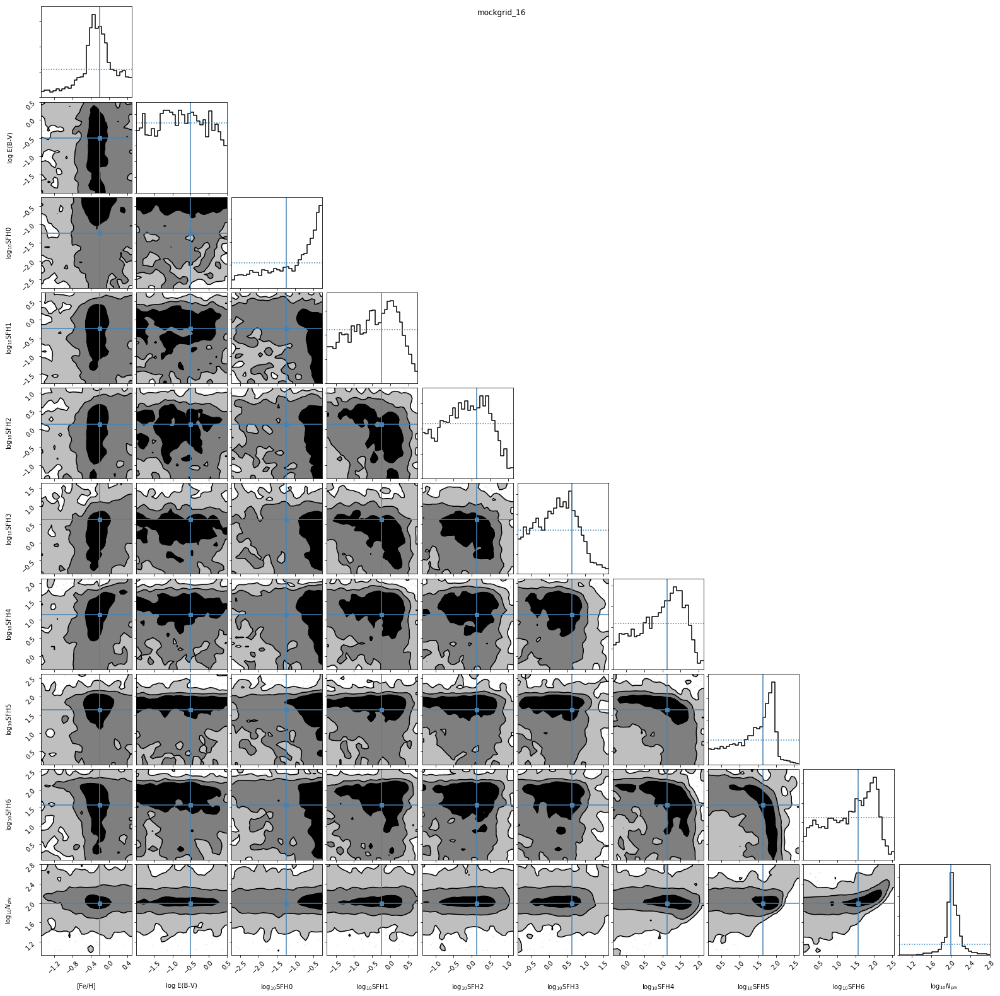

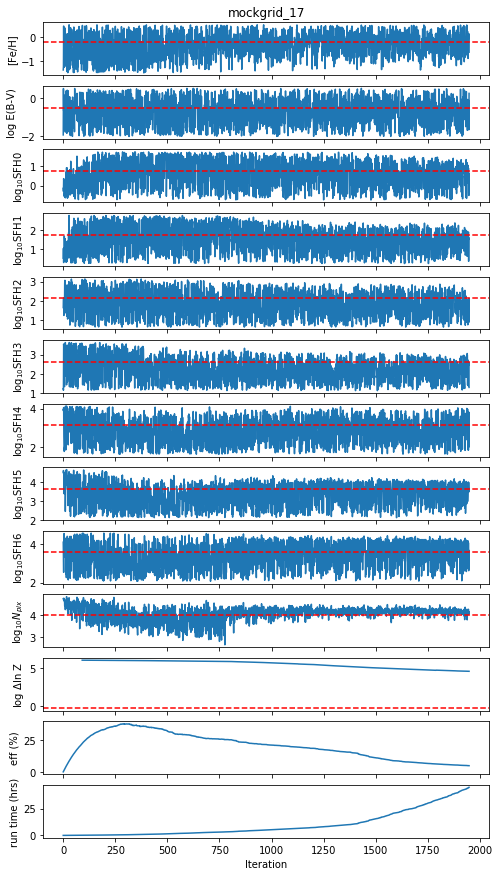

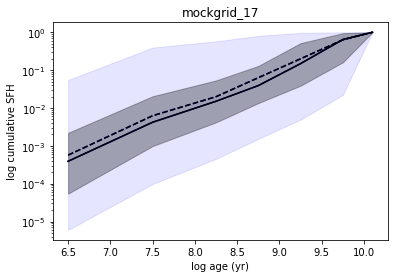

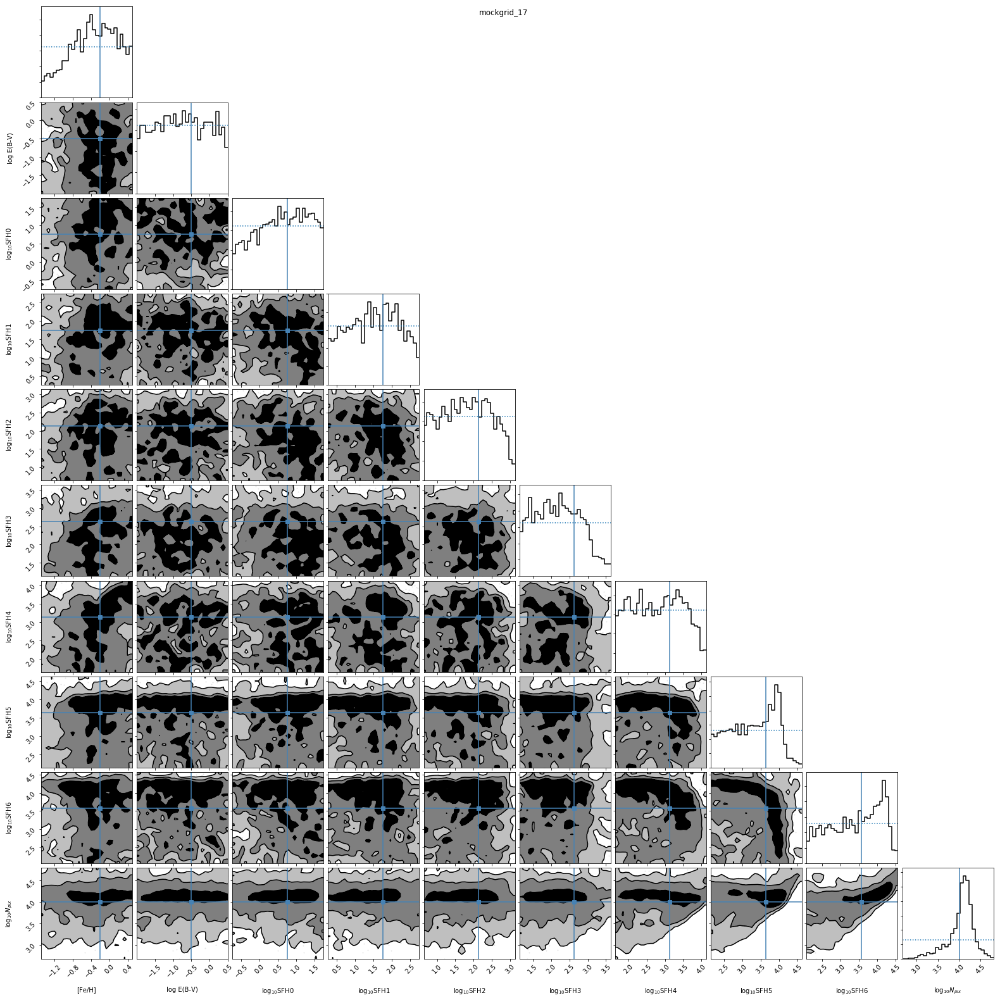

In [16]:
for i in range(18):
    try:
        results[i].plot_everything(burn=burns[i], chain_kwargs=ch_kw, cum_sfh_kwargs=csfh_kw, corner_kwargs=corn_kw,
                              title='mockgrid_{:d}'.format(i));
    except:
        pass